In [11]:
## PyTorch doesn't fully support MPS devices yet (as of Feb 5, 2024)
## See: https://github.com/pytorch/pytorch/issues/77764#
## The following allows PyTorch to fall back to the CPU whenever it
## encounters an unsupported operation
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

In [17]:
from PIL import Image    ## Image tools
import torch
from torchvision import models    ## Pretrained models
from torchvision import transforms    ## Transforms

In [2]:
## Look at the models avaialble
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

Note: Uppercase names are Python classes that implement models, lowercase names are convenience functions that return models instansitatied in those classes.

In [3]:
## Create an instance of the AlexNet class to run the AlexNet architecture
alexnet = models.AlexNet()
## At this point, the weights of the model are in a random state. It is untrained.

In [8]:
## Create an instance of the resnet101 network, a specific implementation of AlexNet
resnet = models.resnet101(weights=models.ResNet101_Weights.DEFAULT)
## This is a 101-layer CNN, already pretrained on 1.2 million images and 1,000 cetegories.
## Here, I asked the model to download the latest wieghts

In [9]:
## Take a peek at the structure of the model
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [14]:
## Prepare to preprocess input images for the model
preprocess = transforms.Compose([
    transforms.Resize(256),        ## scale to 256x256
    transforms.CenterCrop(224),    ## crop to 224x224 around the center
    transforms.ToTensor(),         ## transform to 3D tensor (color, ypos, xpos)
    transforms.Normalize(          ## normalize the RBG values to the same mean and
        mean=[0.485, 0.456, 0.406],##  standard deviation as the data the model was trained on
        std=[0.229, 0.224, 0.225]
    )
])

## Pick an image to try this out on
img = Image.open("../torch_pretrained_vision/practice_data/a_cat.jpg")

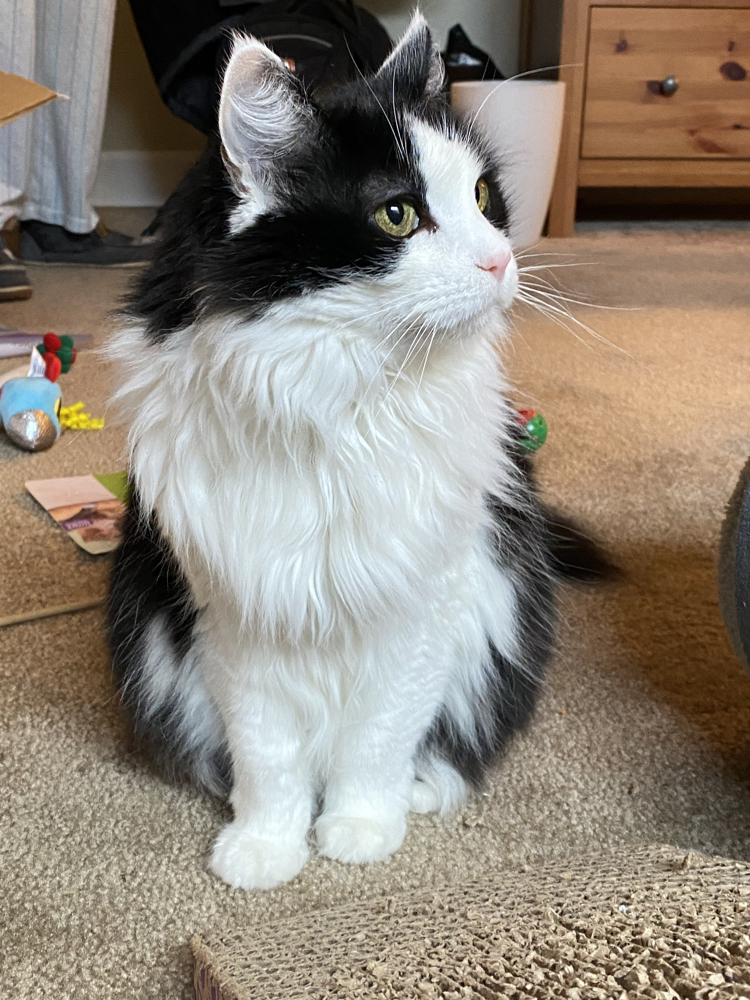

In [16]:
## Check out this cute cat
img

In [18]:
## Transform the image for use as model input
img_t = preprocess(img)

## Reshape, crop, normalize for PyTorch
batch_t = torch.unsqueeze(img_t, 0)

In [19]:
## Put the model in evaluate mode
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [20]:
## Run the input through the model to get output
out = resnet(batch_t)
out

tensor([[-6.1503e-01, -4.8923e-02, -5.7660e-01, -7.1676e-01, -3.7545e-01,
         -4.8803e-01, -4.9509e-01, -2.4200e-01, -2.6930e-01, -3.1285e-01,
         -7.8488e-01, -5.1251e-01, -9.8886e-01,  5.4200e-01, -6.9037e-01,
         -4.9722e-01, -2.2270e-01,  7.4829e-02,  2.4061e-01, -8.0030e-01,
         -6.5420e-01,  1.0576e-01, -5.3573e-01, -1.1372e+00,  2.1096e-01,
         -3.6181e-01, -4.9864e-01, -4.2491e-01, -4.3645e-01, -3.8453e-01,
         -5.7435e-01, -4.3428e-01, -5.2843e-01, -5.4693e-01,  2.1360e-01,
         -1.3951e-01, -1.1407e-01, -3.8290e-02, -7.5957e-01,  1.1443e-01,
         -5.0834e-01, -2.8907e-01,  1.7780e-01, -2.1111e-01, -3.8553e-01,
         -1.3702e-01, -3.4802e-01, -6.4834e-01, -2.1306e-01,  4.3768e-02,
         -1.6617e-01, -4.5611e-01, -5.6579e-01, -9.7667e-01, -2.9073e-01,
         -3.9469e-01,  3.1749e-02,  1.1064e-03,  7.0409e-03, -4.6387e-01,
          6.4694e-01, -6.2585e-01, -9.2238e-01,  1.4286e-01,  6.2084e-01,
          6.7269e-02, -7.5017e-01, -5.

In [22]:
## Load the class labels
with open("../torch_pretrained_vision/practice_data/imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]

In [24]:
## Determine which label is asscociated with the index of the highest value in the output vector
_, index = torch.max(out, 1)
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('283, Persian_cat', 19.3151912689209)

In [25]:
## Look at the top 10 results
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:10]]

[('283, Persian_cat', 19.3151912689209),
 ('285, Egyptian_cat', 8.619542121887207),
 ('539, doormat', 3.700371503829956),
 ('232, Border_collie', 2.4024887084960938),
 ('811, space_heater', 1.5097734928131104),
 ('281, tabby', 1.4596099853515625),
 ('282, tiger_cat', 1.4284640550613403),
 ('478, carton', 1.2163875102996826),
 ('229, Old_English_sheepdog', 0.864102303981781),
 ('552, feather_boa', 0.6849679946899414)]